# Analysis of message forwarding

In [124]:
INPUT_FOLDER = "data/preprocessed_v1/"
OUTPUT_FOLDER = "data/network_v2/"
OUTPUT_FILE = "forward_network_v1"
import os
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
from tqdm import tqdm
import seaborn as sns


In [7]:
# make a list of all the channel files
channels = []
for filename in tqdm(os.listdir(INPUT_FOLDER), desc='channels', unit='filenames', disable=True):
    if filename.endswith('.csv'):
        channels.append(filename)
print(len(channels))

299


In [8]:
#   method to read a channel file to a dataframe
def read_channel(filename):
    dtype_dict = {'id': 'int64', 'views': 'float64', 'message': 'str', 'to_id': 'uint64', \
                  'fwd_from_id': 'str', \
                  'fwd_mes_id': 'str'
                  }
    df = pd.read_csv(os.path.join(INPUT_FOLDER, filename), index_col='Unnamed: 0', dtype=dtype_dict,
                     parse_dates=['date'])
    # Check if 'fwd_date' column exists in the DataFrame
    if 'fwd_date' in df.columns:
        df['fwd_date'] = pd.to_datetime(df['fwd_date'])  # Parse 'fwd_date' as datetime

    if 'fwd_from_id' in df.columns:
        df['fwd_from_id'] = df['fwd_from_id'].astype('UInt64')  # Convert 'fwd_from_id' to int64

    if 'fwd_mes_id' in df.columns:
        df['fwd_mes_id'] = df['fwd_mes_id'].astype('UInt64')
    # df['handle'] = filename[:-4]
    return df

In [14]:
df_test = read_channel(channels[4])
df_test.head()

,date,duration,frw_from_name,frw_from_title,fwd_date,fwd_from_id,fwd_mes_id,handle,id,message,to_id,type,views
0,2022-12-04 10:26:53+00:00,NaN,DtRoad,Дептранс Москвы,2022-12-01 06:02:15,1029095426,21757,akitilop,15377,🚇БКЛ полноценно заработает уже в первом кварта...,1109279145,photo,173.0
1,2022-12-03 19:32:06+00:00,NaN,NaN,NaN,NaT,<NA>,<NA>,akitilop,15376,Активисты «Бессмертного полка» возложили цветы...,1109279145,photo,528.0
2,2022-12-03 18:56:42+00:00,5.0,NaN,NaN,NaT,<NA>,<NA>,akitilop,15375,Как всегда наши учёные расширяют границы возмо...,1109279145,video,512.0
3,2022-12-02 19:27:06+00:00,60.0,NaN,NaN,NaT,<NA>,<NA>,akitilop,15374,Активисты общественных проектов и координаторы...,1109279145,video,644.0
4,2022-12-02 18:58:20+00:00,5.0,NaN,NaN,NaT,<NA>,<NA>,akitilop,15373,В Лужниках состоялся Форум боевых искусств «Би...,1109279145,video,705.0


In [25]:
df_test.query('frw_from_name.notna()').groupby('frw_from_name')[['handle']].count()

,handle
frw_from_name,
AKID_channel,6
ARTolmachev,1
ASGasparyan,3
ATC_ATC,3
AlekseyMukhin,2
...,...
zelenyslonik,2
zerkalo_io,1
zhurvesti,1


In [41]:
for index, row in df.query('frw_from_name.notna()').groupby('frw_from_name').count().iterrows():
    print(index, row['handle'])


AKID_channel 6
ARTolmachev 1
ASGasparyan 3
ATC_ATC 3
AlekseyMukhin 2
AlumniRussia 1
Astrahansky 1
AstraninFromA 1
Babyshka33 1
BankingTruth 1
Baronova 15
Bessro4ka_Pruf 13
BorodaV 10
Caduceusmed 6
CassandRaSach 1
Chesnakov 6
Contora_Pishet 1
Crexcrexcrex 2
Crimea_algorithm 1
CurrentPolicy 2
DavydovIn 10
Den_studenta 5
Doninside 1
Drunkenpolitolog 1
DtOperativno 1
DtRoad 55
ENews112 7
ERD1ERD 1
ErnestMakarenko 1
Federalcity 2
FoRGO_official 1
GorSovetOmsk 3
Gubery 1
Hard_Blog_Line 2
HocenkoVP 3
HouseOfCardsRussia 2
HypeAntihype 83
Ivorytowers 8
KIMMARINA 16
Kalyyugatoday 1
KremlinOne 33
Leningrad_guide 1
Lepragram 3
LudumLocus 12
LukaEbkov 1
MAGnit80 2
Manucharovofficial 2
MariaVladimirovnaZakharova 4
Marinaslovo 2
MayorFSB 394
MedvedevVesti 2
MenyazovutValya 2
MoscowEcon 2
Mrespublika 1
MuesliLavrova 2
Murmansk_insaid 1
NR_novosti 1
NUR24RU 1
N_Eliseeva 6
Natan_tut 83
NewFBK 1
NikonovLive 1
NosovDmitri 6
Oktyabrfest 2
PDFblago 2
P_ofno_Return 1
Peopletalkru 2
Piternadvoih 10
PlushevCha

In [23]:
df_test['handle'][0]

'akitilop'

In [70]:
# create a graph, iterate through all the channels and add edges
G = nx.DiGraph()

for channel in tqdm(channels, desc='Processing channels', disable=False):
    df = read_channel(channel)
    handle = df['handle'][0]
    if 'frw_from_name' not in df.columns:
        # print('No forwarding in channel: ', handle)
        # G.add_node(handle)
        continue
    for index, row in df.query('frw_from_name.notna()').groupby('frw_from_name').count().iterrows():
        # if row['fwd_from_name'] is not None:
        G.add_edge(index, handle, weight=row['handle'])
        # print(index, handle, row['handle'])


Processing channels:  26%|██▌       | 78/299 [00:51<02:44,  1.35it/s]C:\Users\IvarY\AppData\Local\Temp\ipykernel_10772\3408176122.py:7: DtypeWarning: Columns (3) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(os.path.join(INPUT_FOLDER, filename), index_col='Unnamed: 0', dtype=dtype_dict,
Processing channels:  27%|██▋       | 81/299 [00:52<01:33,  2.34it/s]C:\Users\IvarY\AppData\Local\Temp\ipykernel_10772\3408176122.py:7: DtypeWarning: Columns (3) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(os.path.join(INPUT_FOLDER, filename), index_col='Unnamed: 0', dtype=dtype_dict,
Processing channels:  44%|████▍     | 133/299 [01:33<01:17,  2.13it/s]C:\Users\IvarY\AppData\Local\Temp\ipykernel_10772\3408176122.py:7: DtypeWarning: Columns (3) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(os.path.join(INPUT_FOLDER, filename), index_col='Unnamed: 0', dtype=dtype_

In [71]:
# Get edge weights
edge_weights = [G[u][v]['weight'] for u, v in G.edges]
# print(edge_weights)

In [72]:
# Normalize edge weights for visualization
max_weight = max(edge_weights)
edge_weights_normalized = [w / max_weight for w in edge_weights]


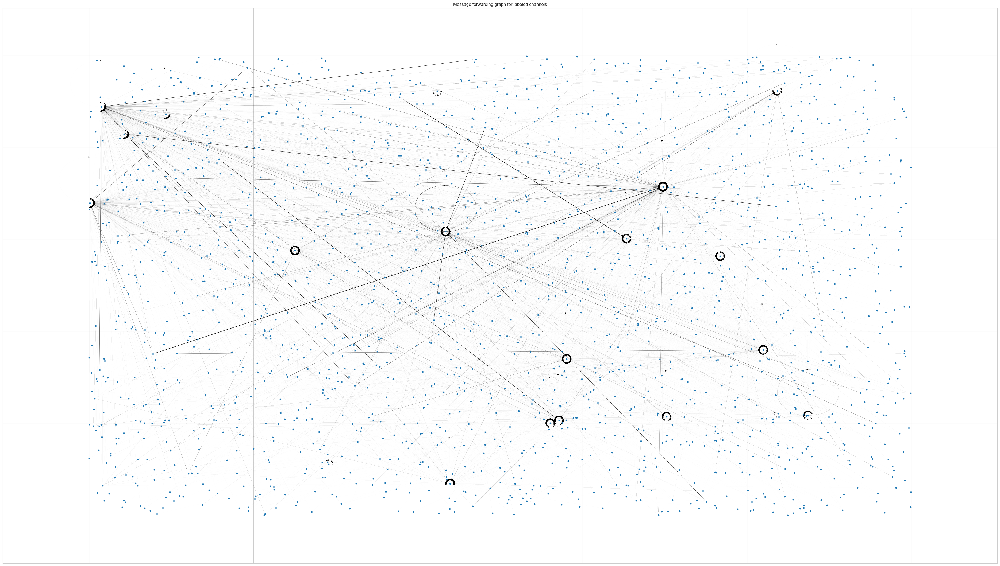

In [95]:
# Draw the graph
# pos = nx.spring_layout(G)
# pos = nx.spectral_layout(G)
pos = nx.random_layout(G)
plt.figure(figsize = (48, 27))
# pos = nx.circular_layout(G)
nx.draw_networkx_nodes(G, pos, node_size=10)
# nx.draw_networkx_edges(G, pos, width=edge_weights)
nx.draw_networkx_edges(G, pos, width=edge_weights_normalized, arrowsize=10)
# nx.draw_networkx_labels(G, pos, font_size=8)
plt.title('Message forwarding graph for labeled channels')
plt.show()

In [96]:
# Identify the threshold for the top 10%
threshold = sorted(edge_weights, reverse=True)[int(0.1 * len(edge_weights))]

In [97]:
# Create a filtered graph with only the top 10% of edges
filtered_edges = [(u, v) for u, v, w in G.edges(data='weight') if w >= threshold]
filtered_graph = G.edge_subgraph(filtered_edges)

# Get edge weights for the filtered edges
filtered_edge_weights = [filtered_graph[u][v]['weight'] for u, v in filtered_graph.edges]

# Normalize edge weights for visualization
max_weight = max(filtered_edge_weights)
edge_weights_normalized = [w / max_weight for w in filtered_edge_weights]

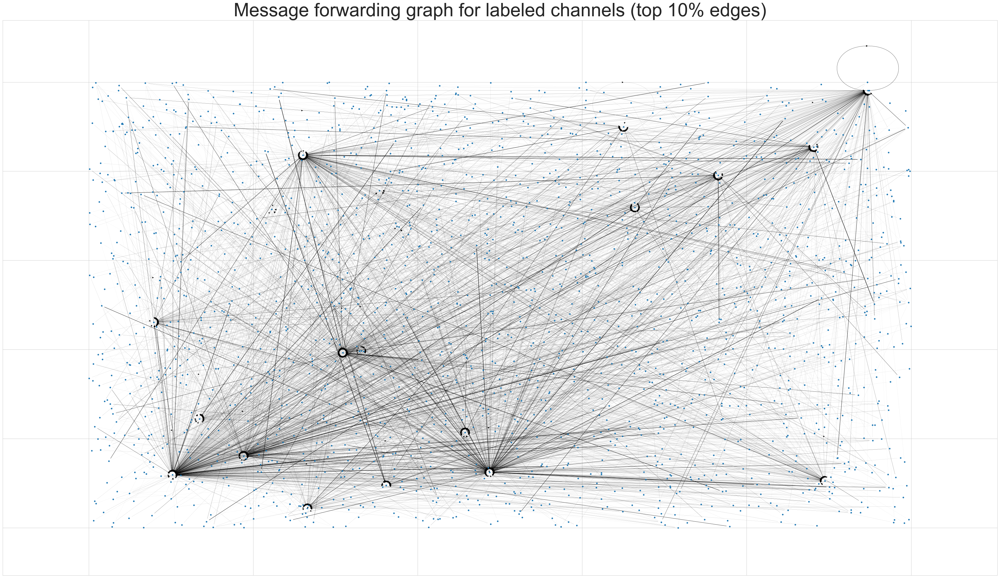

In [102]:
# Draw the filtered graph
# pos = nx.spring_layout(G)
# pos = nx.spectral_layout(G)
pos = nx.random_layout(G)
plt.figure(figsize = (48, 27))
# pos = nx.circular_layout(G)
nx.draw_networkx_nodes(G, pos, node_size=10)
# nx.draw_networkx_edges(G, pos, width=edge_weights)
nx.draw_networkx_edges(G, pos, width=edge_weights_normalized, arrowsize=10)
# nx.draw_networkx_labels(G, pos, font_size=8)
plt.title('Message forwarding graph for labeled channels (top 10% edges)', fontsize=50)
plt.show()

In [109]:
# Get top n% forwarded channels
top_n_percent = 0.03
# Calculate the total number of forwards for each channel
channel_forwards = dict(G.out_degree(weight='weight'))
# Identify the top 10% of channels based on total forwards
top_channels = sorted(channel_forwards, key=channel_forwards.get, reverse=True)[:int(top_n_percent * len(channel_forwards))]


In [114]:
# Create a DataFrame for plotting
top_channels_df = pd.DataFrame({'Channel': top_channels, 'ForwardCount': [channel_forwards[channel] for channel in top_channels]})

In [115]:
# Sort the DataFrame for better visualization
top_channels_df = top_channels_df.sort_values(by='ForwardCount', ascending=False)


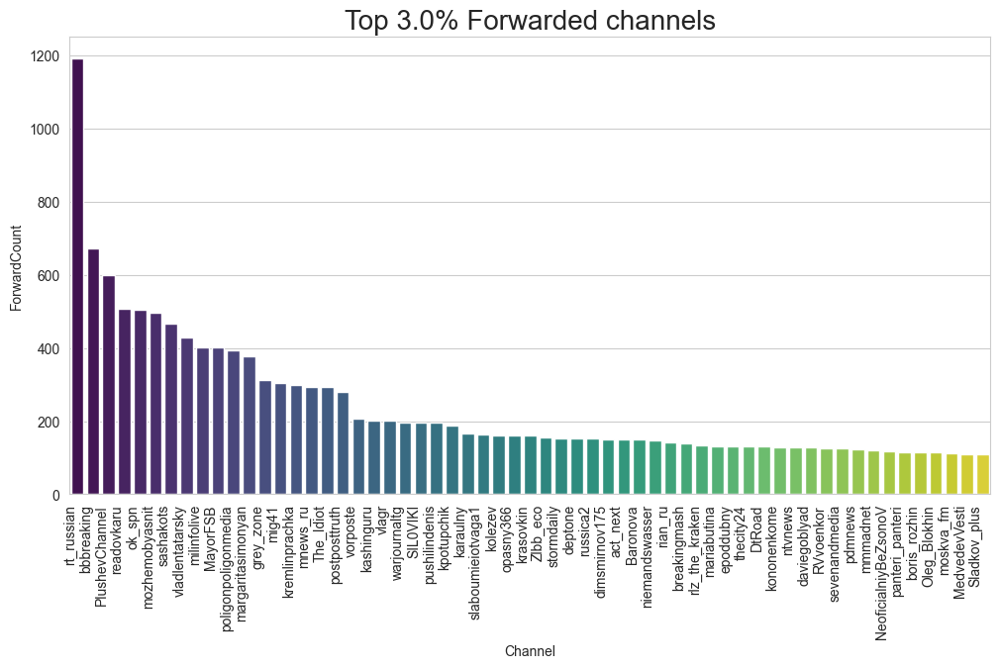

In [123]:
# Create a Seaborn bar chart
plt.figure(figsize=(12, 6))
sns.barplot(x='Channel', y='ForwardCount', data=top_channels_df, palette='viridis', hue='Channel')
plt.xticks(rotation=90, ha='right')
plt.title(f'Top {top_n_percent*100}% Forwarded channels', fontsize=20)
plt.show()

# Saving the graph

In [ ]:
nx.write_gexf(G, os.path.join(OUTPUT_FOLDER, OUTPUT_FILE + '.gexf'))

In [82]:
layout = nx.spring_layout(G)

In [ ]:
plt.figure(figsize=(48, 27))  # Adjust the figure size as needed
nx.draw(G, pos=layout, with_labels=True, node_size=100, node_color='skyblue',
        font_size=8, font_color='black', font_weight='bold', arrowsize=10,
        arrowstyle='fancy', connectionstyle='arc3,rad=0.1', width=edge_weights_normalized)

plt.title('Large of Related Forwarded channels!')
plt.show()